# HistoMapTx Tutorial: Mapping Annotations to Visium HD Data

This tutorial shows how to map histological annotations from QuPath onto Visium HD bins and generate an annotation map.

## Overview

1. Load Visium HD data
2. Create a HistoMap object with a histological annotation GeoJSON
3. Compute annotation overlaps
4. Generate and visualize the annotation map
5. Export results for downstream analysis

> **Tip:** If you want to filter background bins first, run the [Tissue Detection tutorial](1_Tissue_detection_HD.ipynb) before this one.

## 1. Setting up the Environment

Import the necessary libraries and suppress warnings to keep the notebook clean.

In [ ]:
# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

# Import required libraries
import spatialdata  # For handling spatial data objects
import spatialdata_io  # For reading spatial data formats
import histomaptx as hm  # Main package for annotation integration
import matplotlib.pyplot as plt  # For visualization

# Set figure size for better visualization
plt.rcParams['figure.figsize'] = [12, 10]

## 2. Creating the HistoMap Object

We need three key inputs:

| Input | Description |
|-------|-------------|
| `visium_path` | Path to the Space Ranger output folder |
| `annotation_file` | Histological annotation GeoJSON exported from QuPath |
| `full_res_image` | Full-resolution image used for annotation and Space Ranger |

### 2.1 Set Paths

In [9]:
# Path to your Visium dataset folder (containing the SpaceRanger output)
visium_path = "/home/croizer/Documents/01_Ressources/02_Public_Visium/VisiumHD_colon"

# Path to QuPath annotation GeoJSON file
annotation_file = "/home/croizer/Documents/03_Paper/05_Histomap/colon/tissue_detect.geojson.gz"

# Path to full resolution TIFF image (the one used for annotation and SpaceRanger)
full_res_image = "/home/croizer/Documents/01_Ressources/02_Public_Visium/VisiumHD_colon/Visium_HD_Human_Colon_Cancer_tissue_image.btf"

In [10]:
# Load the Visium data using spatialdata_io
visium = spatialdata_io.visium_hd(visium_path, dataset_id="Visium_HD_Human_Colon_Cancer")

### 2.2 Choose Resolution

Visium HD data is available at multiple bin sizes. Choose the resolution you want to work with: `02`, `08`, or `16` micron bins.

In [11]:
resolution = '16'

## 5. Loading Histological Annotations

Now load the main histological annotations (tumor, stroma, necrosis, etc.) as a new HistoMap object.

For large whole-slide images with complex tissue masks, it is common to separate tissue detection and histological annotations into two GeoJSON files. Here we load the annotation file and create a new HistoMap object.

In [18]:
# Path to QuPath annotation GeoJSON file
annotation_file = "/home/croizer/Documents/03_Paper/05_Histomap/colon/full_annot_stroma_debris.geojson.gz"


In [19]:
# Create a HistoMap object by combining the annotation file, Visium data, and the full resolution image
histomap = hm.HistoMap(annotation_file, visium, full_res_image, visium_type='visium_hd', bin_size=int(resolution))

# Display information about the HistoMap object
print(histomap)

HistoMap Object

--------Annotation--------
📂 Annotation file used: /home/croizer/Documents/03_Paper/05_Histomap/colon/full_annot_stroma_debris.geojson.gz
📂 Full resolution image used: /home/croizer/Documents/01_Ressources/02_Public_Visium/VisiumHD_colon/Visium_HD_Human_Colon_Cancer_tissue_image.btf
🔢 Number of annotations present: 11
🏷 Annotations: Debris, Muscle, Muscle_muqueuse, Necrosis, Normal, Stroma_normal, Stroma_tumor, Tumor, blood, demosplastic_stroma, loose_stroma
🏷 Activated annotations: Normal, Muscle, Necrosis, Tumor, blood, Muscle_muqueuse, demosplastic_stroma, Debris, Stroma_normal, loose_stroma, Stroma_tumor
🏷 Disabled annotations: 

-------Spatial Data--------
Type is visium_hd

SpatialData object
├── Images
│     ├── 'Visium_HD_Human_Colon_Cancer_full_image': DataTree[cyx] (3, 48740, 75250), (3, 24370, 37625), (3, 12185, 18812), (3, 6092, 9406), (3, 3046, 4703)
│     ├── 'Visium_HD_Human_Colon_Cancer_hires_image': DataArray[cyx] (3, 3886, 6000)
│     └── 'Visium_HD_H

### 5.1 Visualize Annotations

### 5.2 Compute Annotation Overlaps

Compute the percentage overlap between each bin and every annotation region.

Starting calculating overlap
1/11 layer processed: Debris
Make union
sjoin
Intersecting spots: 2604
2/11 layer processed: Muscle
Make union
sjoin
Intersecting spots: 8921
3/11 layer processed: Muscle_muqueuse
Make union
sjoin
Intersecting spots: 1127
4/11 layer processed: Necrosis
Make union
sjoin
Intersecting spots: 603
5/11 layer processed: Normal
Make union
sjoin
Intersecting spots: 12908
6/11 layer processed: Stroma_normal
Make union
sjoin
Intersecting spots: 15360
7/11 layer processed: Stroma_tumor
Make union
sjoin
Intersecting spots: 58736
8/11 layer processed: Tumor
Make union
sjoin
Intersecting spots: 56879
9/11 layer processed: blood
Make union
sjoin
Intersecting spots: 4446
10/11 layer processed: demosplastic_stroma
Make union
sjoin
Intersecting spots: 34296
11/11 layer processed: loose_stroma
Make union
sjoin
Intersecting spots: 7880
Updated 'Annotation_positive' for 'Normal' with threshold 50%.
Updated 'Annotation_positive' for 'Muscle' with threshold 50%.
Updated 'Annotati

### 5.3 Set Plot Order and Generate Annotation Map

The annotation map assigns each bin to the annotation with the highest overlap. Set the priority order for overlapping annotations.

In [ ]:
histomap.display_plot_order()

Current Plot Order:


,Annotation,plot_order
412,Debris,0
228,Muscle,1
403,Muscle_muqueuse,2
237,Necrosis,3
163,Normal,4
431,Stroma_normal,5
433,Stroma_tumor,6
280,Tumor,7
388,blood,8
406,demosplastic_stroma,9


In [ ]:
histomap.change_plot_order(['blood', 'Tumor', "Debris",'Necrosis','Normal', 'Muscle_muqueuse', 'Muscle', 'demosplastic_stroma', 'loose_stroma', "Stroma_tumor", 'Stroma_normal'])

Current Plot Order:


In [ ]:
histomap.generate_annotation_map()

Annotating remaining spots with the most overlapping annotation...
Annotation map successfully generated


INFO     Using 'datashader' backend with 'mean' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


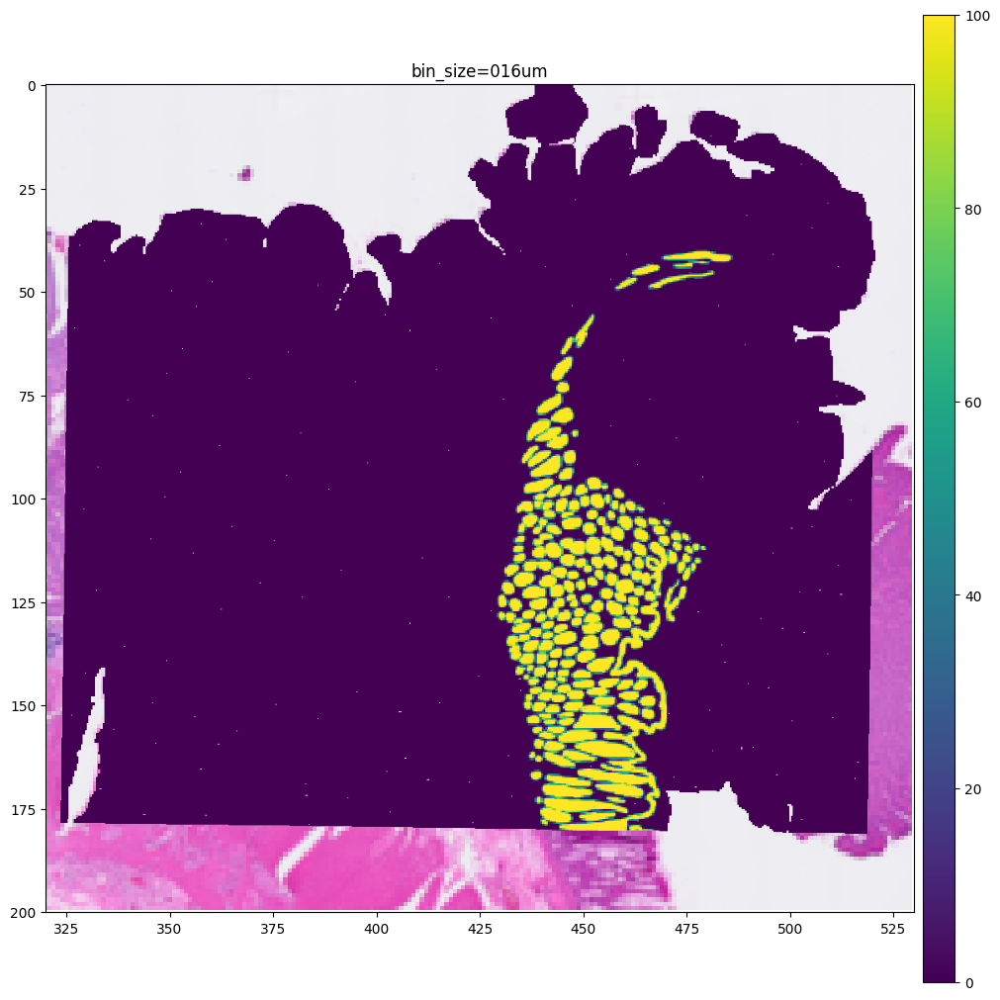

In [ ]:
hm.plot_annotation_overlay(histomap, annotation= 'Normal', xcoords=(320, 530), ycoords=(0, 200))

INFO     Using 'datashader' backend with 'mean' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


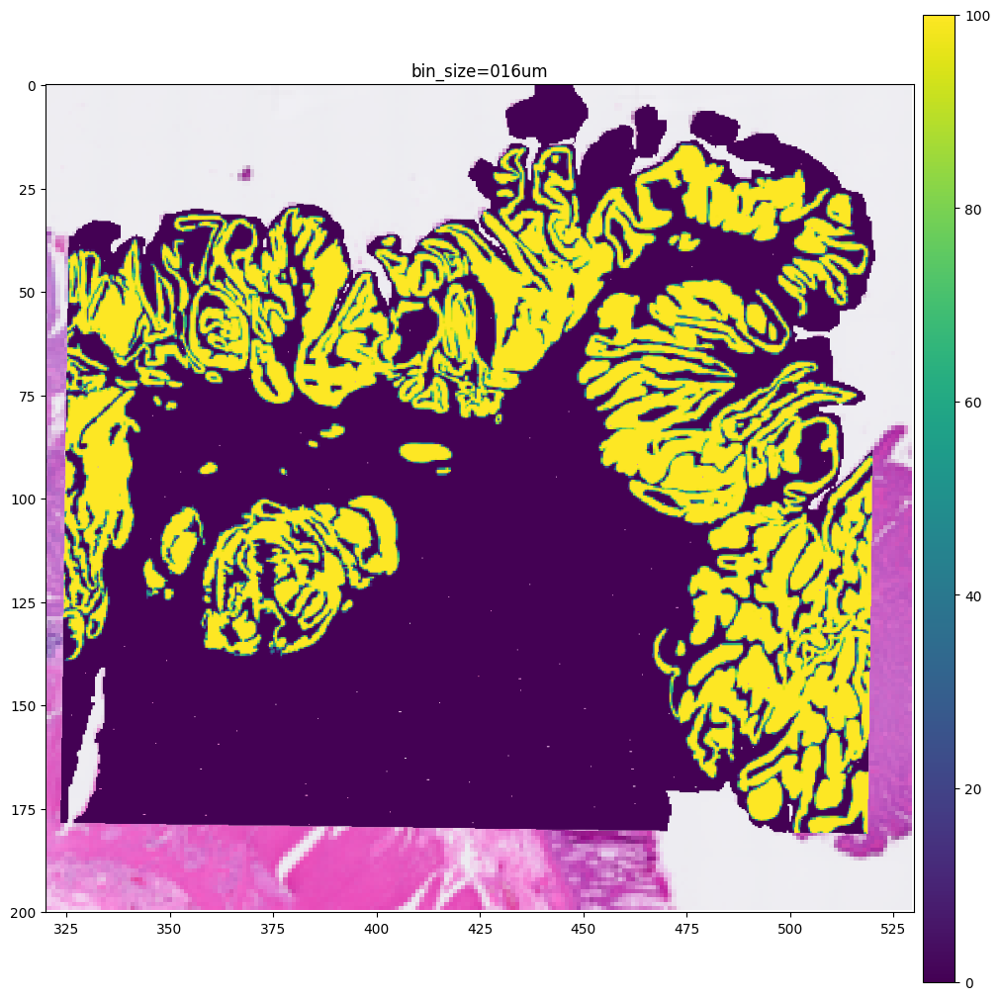

In [ ]:
hm.plot_annotation_overlay(histomap, annotation= 'Tumor', xcoords=(320, 530), ycoords=(0, 200))

INFO     Using 'datashader' backend with 'mean' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


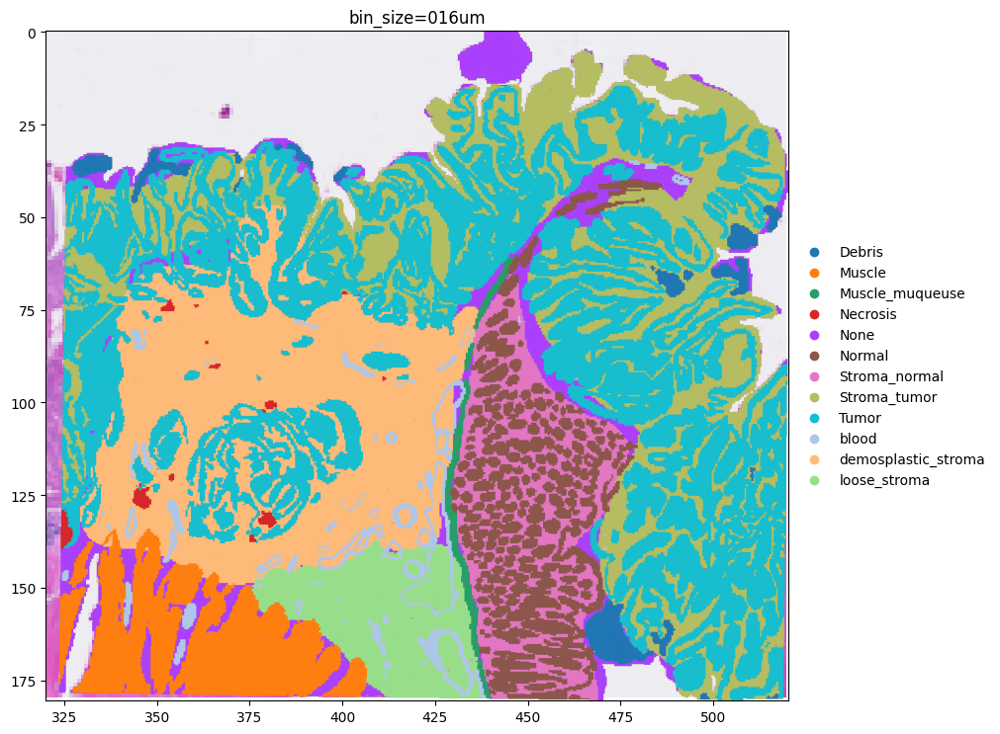

In [ ]:
hm.plot_annotation_map(histomap, xcoords=(320, 520), ycoords=(0, 180))

In [ ]:
df = histomap.visium_spatialdata.tables['square_0'+resolution+'um'].obs
#df.to_csv("/home/croizer/Documents/03_Paper/05_Histomap/colon/annotation_visium_barcode.csv")

: 

In [ ]:
adata3 = visium.tables['square_0'+resolution+'um'].copy()
del visium

import scanpy as sc
sc.pp.filter_cells(adata3, min_counts=1)
sc.pp.filter_genes(adata3, min_counts=1)
sc.pp.normalize_total(adata3)
sc.pp.log1p(adata3)

# HVG selection BEFORE scaling
sc.pp.highly_variable_genes(adata3, n_top_genes=15000)

# Then subset to HVGs
adata3 = adata3[:, adata3.var.highly_variable]

# Now scale
sc.pp.scale(adata3)

# Continue
sc.tl.pca(adata3)
sc.pp.neighbors(adata3)
sc.tl.umap(adata3)

In [ ]:
import pandas as pd 
df = pd.read_csv("/home/croizer/Documents/03_Paper/05_Histomap/colon/tissue_overlap_visium_barcode"+resolution+".csv")
df.index = df['Unnamed: 0']
df
adata3.obs['Positive_overlap'] = (
    df['Positive_overlap']
    .reindex(adata3.obs.index)
)
adata3.obs

,in_tissue,array_row,array_col,location_id,region,Normal_overlap,Muscle_overlap,Necrosis_overlap,Tumor_overlap,blood_overlap,Muscle_muqueuse_overlap,demosplastic_stroma_overlap,Debris_overlap,Stroma_normal_overlap,loose_stroma_overlap,Stroma_tumor_overlap,Annotation_map,n_counts,Positive_overlap
s_016um_00052_00082-1,1,52,82,0,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,None,43.0,0.000000
s_016um_00010_00367-1,1,10,367,1,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,Tumor,4024.0,100.000000
s_016um_00163_00399-1,1,163,399,2,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,Stroma_tumor,1410.0,100.000000
s_016um_00238_00388-1,1,238,388,3,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,100.0,Debris,378.0,100.000000
s_016um_00144_00175-1,1,144,175,4,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,demosplastic_stroma,531.0,100.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,1,375,231,137046,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,None,1270.0,20.043426
s_016um_00109_00223-1,1,109,223,137047,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,Muscle_muqueuse,820.0,100.000000
s_016um_00039_00175-1,1,39,175,137048,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,loose_stroma,207.0,70.872146
s_016um_00037_00193-1,1,37,193,137049,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,loose_stroma,42.0,37.667322


In [ ]:
histomap.

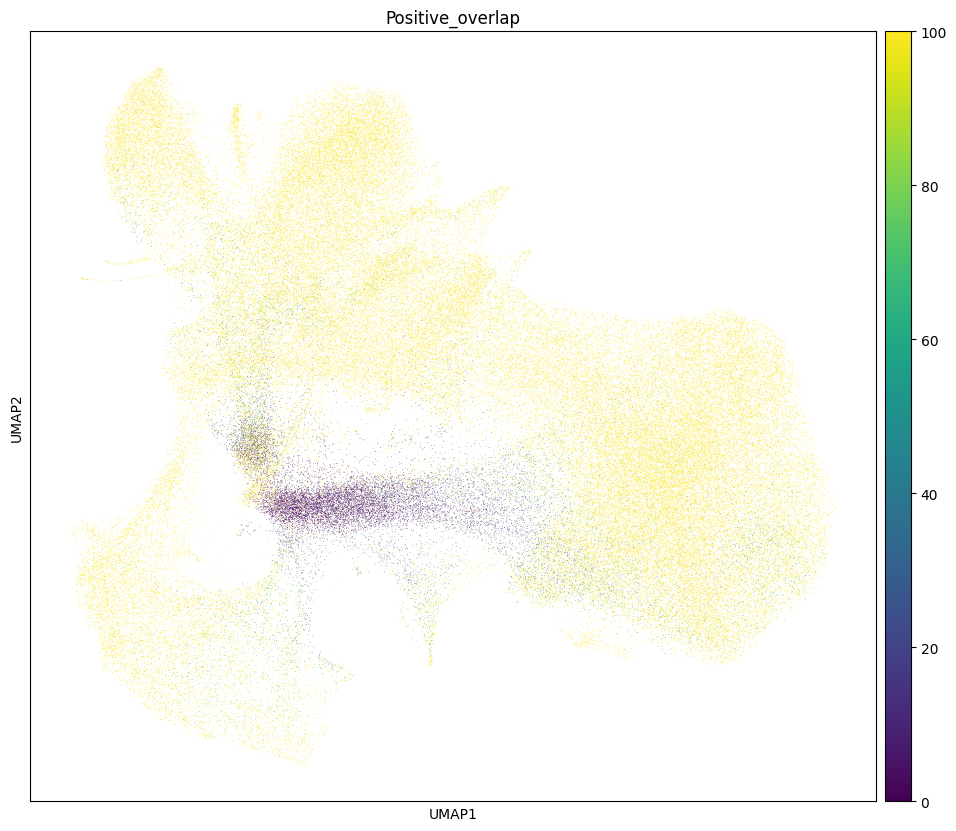

In [ ]:
sc.pl.umap(adata3, color='Positive_overlap')

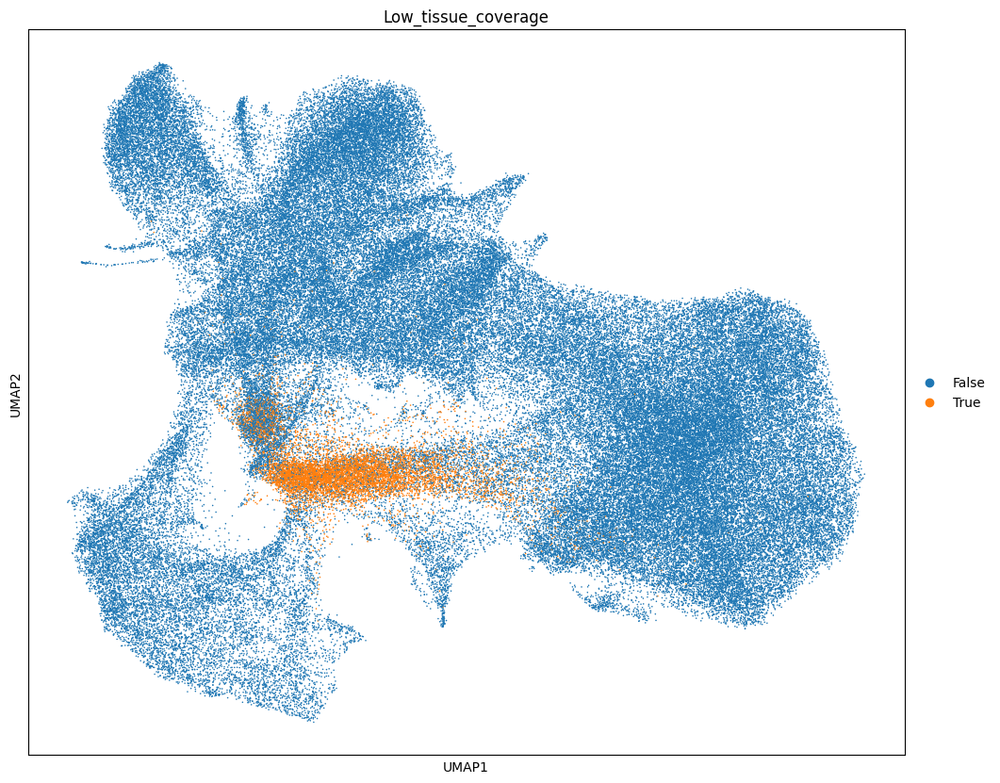

In [ ]:
adata3.obs['Low_tissue_coverage'] = adata3.obs['Positive_overlap']<5
sc.pl.umap(adata3, color='Low_tissue_coverage', size=5)

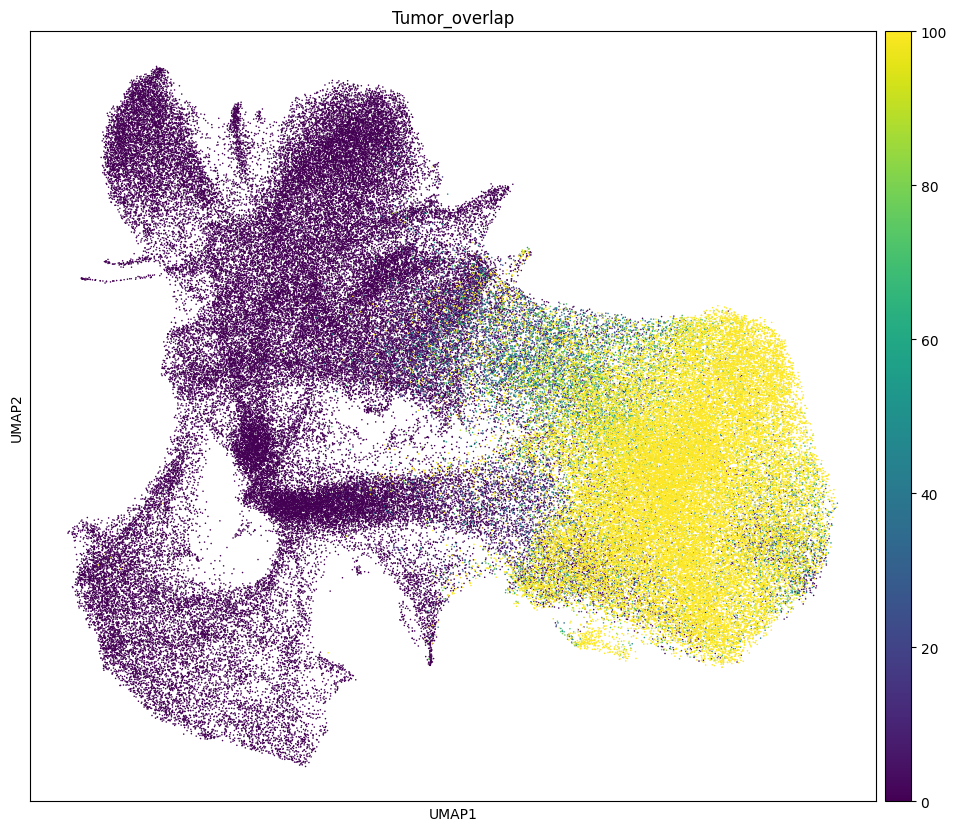

In [ ]:
sc.pl.umap(adata3, color='Tumor_overlap', size=5)

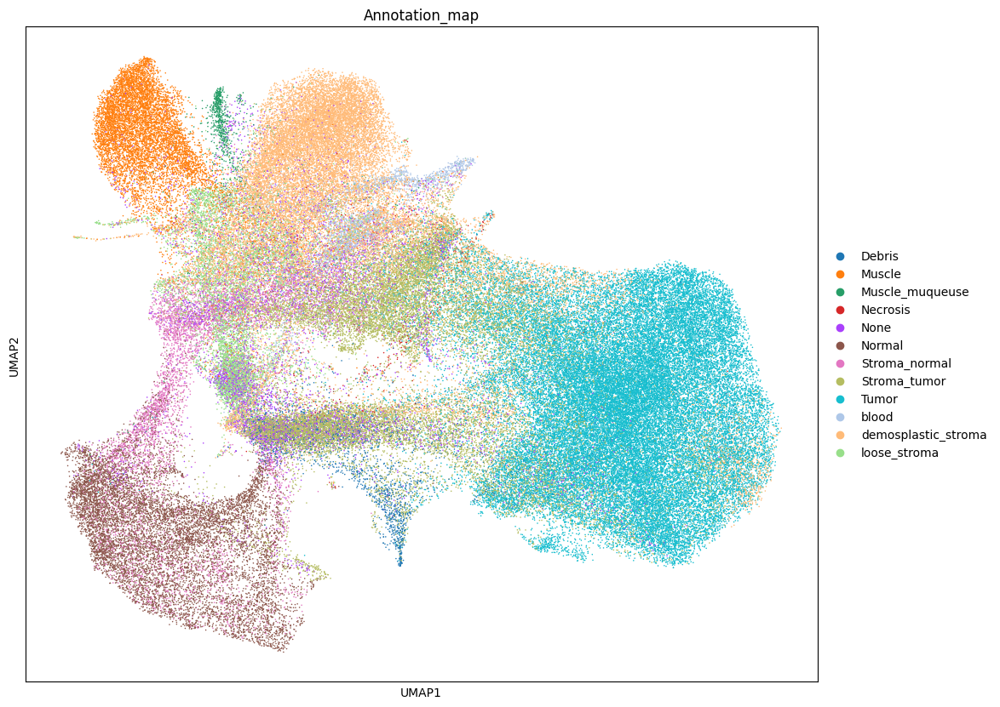

In [ ]:
sc.pl.umap(adata3, color='Annotation_map', size=5)

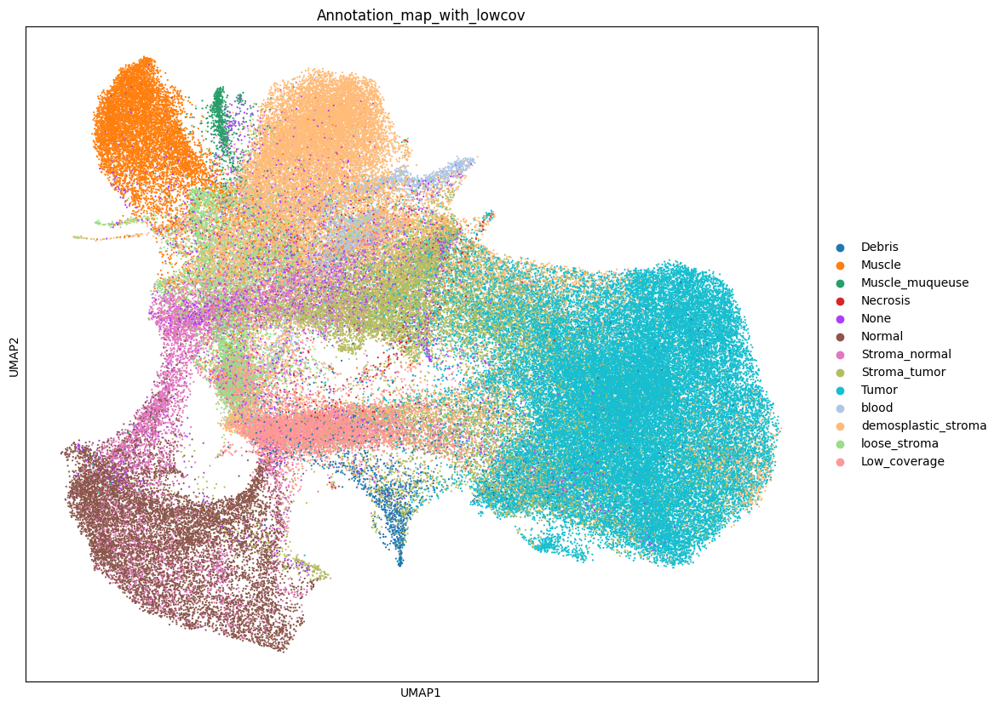

In [ ]:
adata3.obs['Annotation_map_with_lowcov'] = adata3.obs['Annotation_map'].copy()

adata3.obs['Annotation_map_with_lowcov'] = (
    adata3.obs['Annotation_map_with_lowcov']
    .cat.add_categories(['Low_coverage'])
)

adata3.obs.loc[
    adata3.obs['Low_tissue_coverage'], 
    'Annotation_map_with_lowcov'
] = 'Low_coverage'
sc.pl.umap(adata3, color='Annotation_map_with_lowcov', size=10)

# Load results

In [ ]:
import scanpy as sc

In [ ]:
adata3.write_h5ad('/home/croizer/Documents/03_Paper/05_Histomap/colon/annotated_colon.h5ad')

In [ ]:
adata = sc.read_h5ad('/home/croizer/Documents/03_Paper/05_Histomap/colon/annotated_colon.h5ad')

In [ ]:
sc.pl.umap(adata,color='Annotation_map_with_lowcov',  size=15)

NameError: name 'sc' is not defined

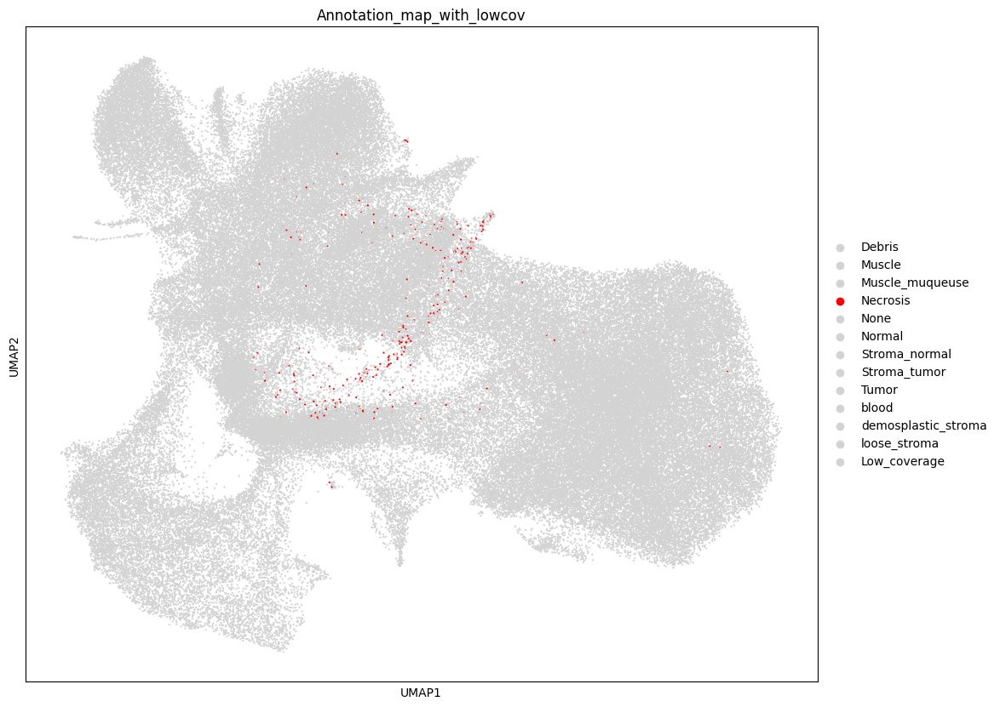

In [ ]:
# Get categories
cats = adata3.obs['Annotation_map_with_lowcov'].cat.categories

# Build palette: grey for all, red for target
palette = ['lightgrey'] * len(cats)
target_idx = list(cats).index('Necrosis')
palette[target_idx] = 'red'

sc.pl.umap(
    adata3,
    color='Annotation_map_with_lowcov',
    palette=palette,
    size=10
)

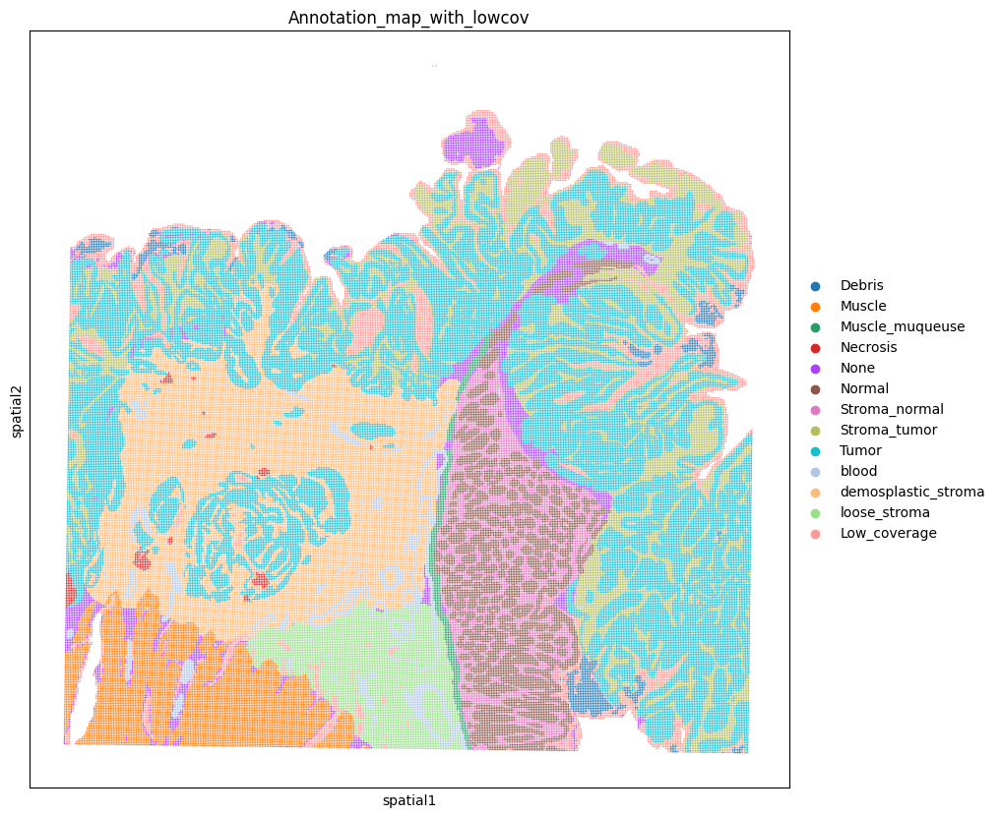

In [ ]:
sc.pl.spatial(adata, color='Annotation_map_with_lowcov', spot_size=50)

In [ ]:
df = adata.obs


threshold = 95

subset_all = df[
    df.apply(
        lambda row: (
            pd.notna(row["Annotation_map_with_lowcov"]) and
            row["Annotation_map_with_lowcov"] not in ["None", "Low_coverage", "Debris", None] and
            row[f"{row['Annotation_map_with_lowcov']}_overlap"] > threshold
        ),
        axis=1
    )
]

In [ ]:
adata2 = adata[subset_all.index].copy()

In [ ]:
adata2

AnnData object with n_obs × n_vars = 102313 × 15000
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'Normal_overlap', 'Muscle_overlap', 'Necrosis_overlap', 'Tumor_overlap', 'blood_overlap', 'Muscle_muqueuse_overlap', 'demosplastic_stroma_overlap', 'Debris_overlap', 'Stroma_normal_overlap', 'loose_stroma_overlap', 'Stroma_tumor_overlap', 'Annotation_map', 'n_counts', 'Positive_overlap', 'Low_tissue_coverage', 'Annotation_map_with_lowcov'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Annotation_map_colors', 'Annotation_map_with_lowcov_colors', 'Low_tissue_coverage_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

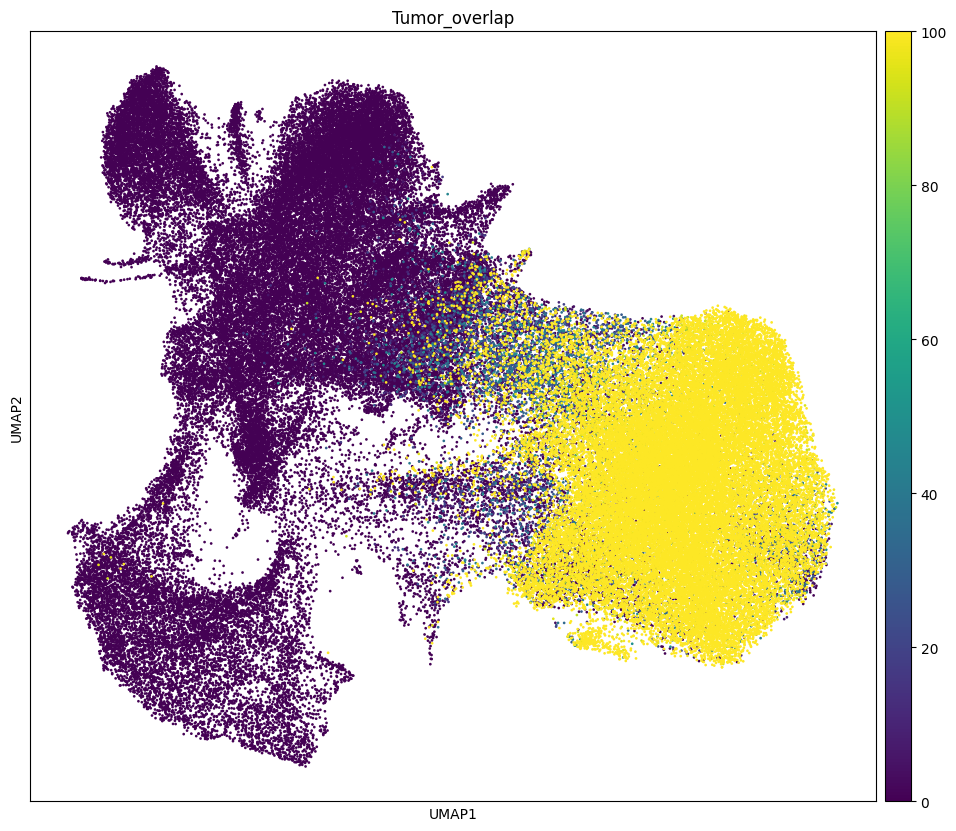

In [ ]:
sc.pl.umap(adata2,color='Tumor_overlap',  size=15)

In [ ]:

# Now scale
sc.pp.scale(adata2)

# Continue
sc.tl.pca(adata2)
sc.pp.neighbors(adata2)
sc.tl.umap(adata2)

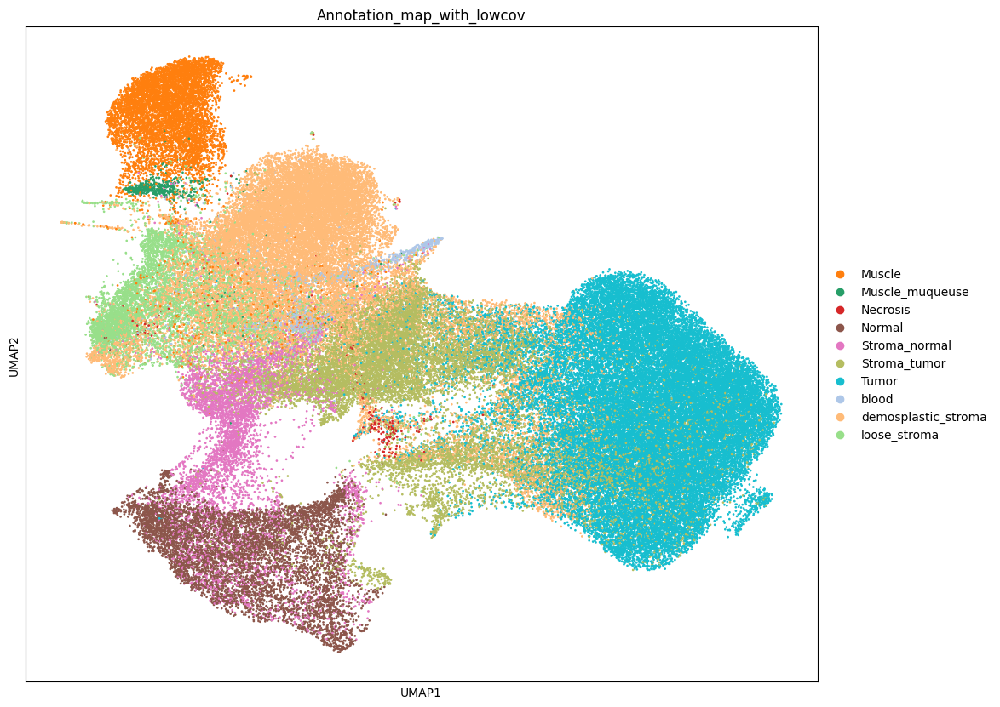

In [ ]:
sc.pl.umap(adata2,color='Annotation_map_with_lowcov',  size=15)

In [ ]:
adata.obs

,in_tissue,array_row,array_col,location_id,region,Normal_overlap,Muscle_overlap,Necrosis_overlap,Tumor_overlap,blood_overlap,...,demosplastic_stroma_overlap,Debris_overlap,Stroma_normal_overlap,loose_stroma_overlap,Stroma_tumor_overlap,Annotation_map,n_counts,Positive_overlap,Low_tissue_coverage,Annotation_map_with_lowcov
s_016um_00052_00082-1,1,52,82,0,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,None,43.0,0.000000,True,Low_coverage
s_016um_00010_00367-1,1,10,367,1,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,100.0,0.0,...,0.0,0.0,0.0,0.0,100.0,Tumor,4024.0,100.000000,False,Tumor
s_016um_00163_00399-1,1,163,399,2,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,100.0,Stroma_tumor,1410.0,100.000000,False,Stroma_tumor
s_016um_00238_00388-1,1,238,388,3,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,100.0,0.0,0.0,100.0,Debris,378.0,100.000000,False,Debris
s_016um_00144_00175-1,1,144,175,4,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,100.0,0.0,0.0,0.0,0.0,demosplastic_stroma,531.0,100.000000,False,demosplastic_stroma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,1,375,231,137046,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,None,1270.0,20.043426,False,None
s_016um_00109_00223-1,1,109,223,137047,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Muscle_muqueuse,820.0,100.000000,False,Muscle_muqueuse
s_016um_00039_00175-1,1,39,175,137048,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,100.0,0.0,loose_stroma,207.0,70.872146,False,loose_stroma
s_016um_00037_00193-1,1,37,193,137049,Visium_HD_Human_Colon_Cancer_square_016um,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,100.0,0.0,loose_stroma,42.0,37.667322,False,loose_stroma


In [ ]:
adata.var_names_make_unique()

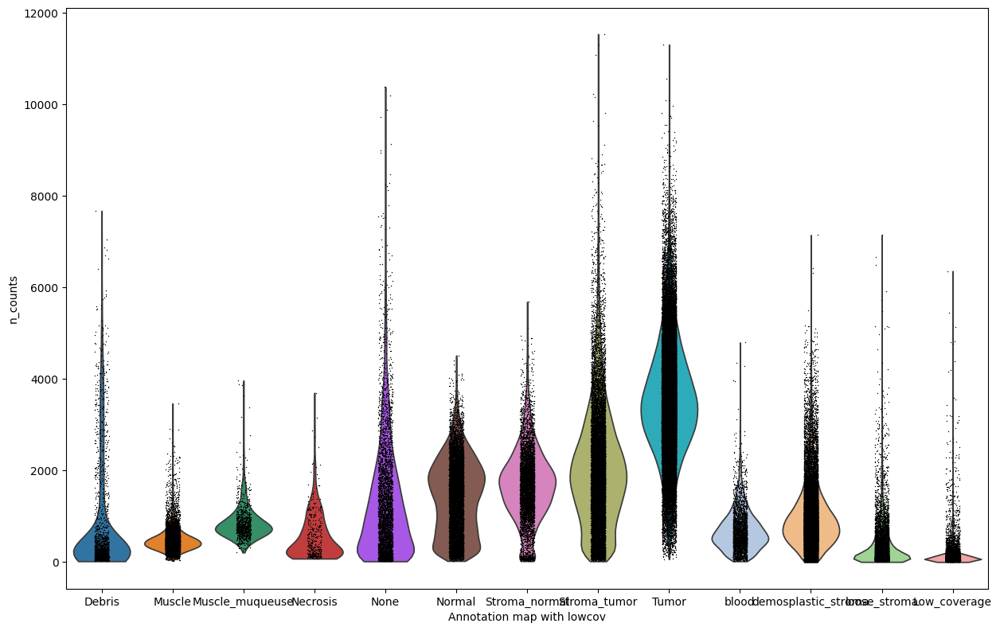

In [ ]:
sc.pl.violin(adata, 'n_counts', groupby='Annotation_map_with_lowcov')

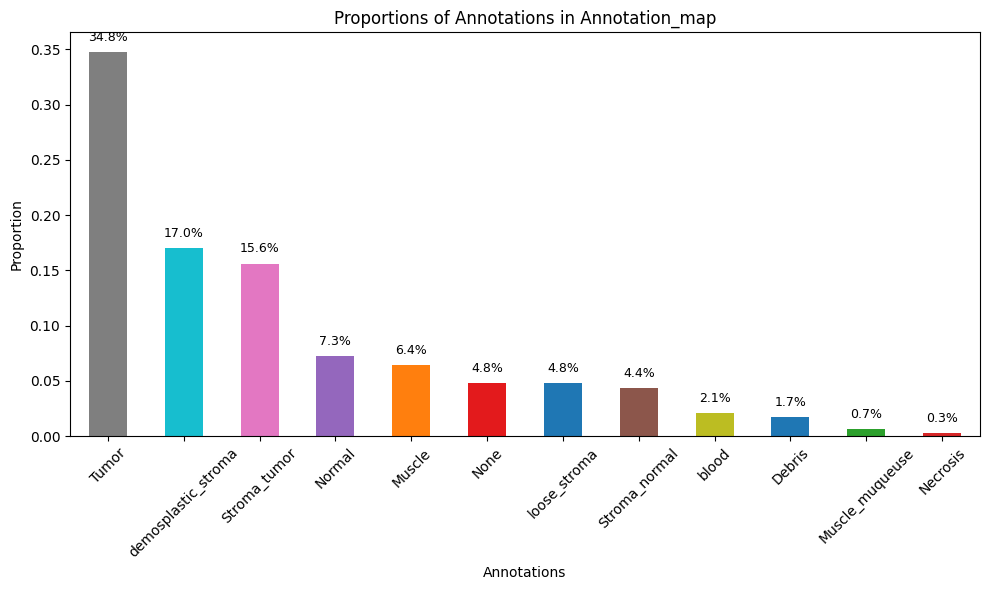

In [ ]:
hm.plot_annotation_map_proportions(histomap)